# Imports

In [2]:
import os
import errno
from importlib import reload
import pickle 
from pprint import pprint
from itertools import product
from glob import glob
from os.path import basename, splitext, split, exists, join

In [3]:
import pandas as pd
from scipy import stats
import scipy as sp
import numpy as np

import matplotlib.pyplot as plt
import matplotlib
# just so saved plots aren't also shown
matplotlib.use('Agg')
%matplotlib inline
import seaborn as sns

import pymc3 as pm
import theano as T
import theano.tensor as tt
import arviz as az
import xarray as xr

In [4]:
# packages versions
print(
    '\n'.join(
        f'{m.__name__}=={m.__version__}' 
        for m in globals().values() 
        if getattr(m, '__version__', None)
    )
)

pandas==1.5.2
scipy==1.10.1
numpy==1.21.5
matplotlib==3.7.0
seaborn==0.11.2
pymc3==3.11.4
theano==1.1.2
arviz==0.14.0
xarray==2023.1.0


In [5]:
from functions import models_fixedarray

reload(models_fixedarray)

<module 'functions.models_fixedarray' from '/mnt/c/Users/faust/OneDrive - UvA/research_projects/2022_arglang/arglang_modelling/modeling/functions/models_fixedarray.py'>

In [6]:
from functions.models_fixedarray import *
from functions.helper_functions import (
    save_trace, 
    load_trace, 
    get_traces, 
    verify,
    normalize,
    softmax,
    parameter_recovery_MAP,
    calculate_bayesian_posterior_pvalue,
    theano_calculate_pragmatic_speaker
)
from functions.data_functions import get_and_clean_data_exp1
from functions.plotting import (
    plot_MAP_recovery,
    calculate_arg_deltas,
    calculate_info_deltas,
    scatter_hist,
    plot_marginal_deltas,
    plot_obswise_deltas
)

In [7]:
from functions.argstrengths import (
    calculate_argumentative_strength,
    calculate_maximin_argstrength,
    calculate_nonparametric_argstrength,
    theano_calculate_pragmatic_argstrength
)

# Analysis of pilot data

## Get pilot data

In [10]:
# This is the location of the traces in Fausto's system
# but they are too large for github.
folder_pilot_traces = '../../arglang_model_fitting/pilot_models_traces/'
# location of raw data in Fausto's system
# but if you've cloned the repo you can just run
# the cell below to load the cleaned data directly
folder_pilot_data = '../../arglang_exp/data_pilot/data_raw.csv'
folder_pilot_cleaned_data = '../data/data_pilot/'

In [11]:
if exists(folder_pilot_data):
    pilot_data = get_and_clean_data_exp1(pathdata=folder_pilot_data)
    raw_data, data, possible_observations, possible_utterances = pilot_data
    data.to_csv(join(folder_pilot_cleaned_data, 'cleaned_data.csv'), index=False)
    pd.DataFrame(possible_observations).to_csv(join(folder_pilot_cleaned_data, 'obs.csv'), index=False)
    pd.DataFrame(possible_utterances).to_csv(join(folder_pilot_cleaned_data, 'utts.csv'), index=False)
else:
    # read the pre-cleaned data
    data = pd.read_csv(join(folder_pilot_cleaned_data, 'cleaned_data.csv'))
    possible_observations = pd.read_csv(join(folder_pilot_cleaned_data, 'obs.csv')).to_numpy()
    possible_utterances = pd.read_csv(join(folder_pilot_cleaned_data, 'utts.csv')).to_numpy()

a total of 200 of the raw datapoints are test trials. This leaves 20 potential datapoints per participant.
8  were excluded because incompletely recorded
4  of the participants were excluded as they gave more than 4 false responses
52  of the observations in the included participants were excluded because literally false


/mnt/c/Users/faust/OneDrive - UvA/research_projects/2022_arglang/arglang_modelling/modeling/functions/data_functions.py:82: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  str(len(data[raw_data['trial_name'] != 'main_trials'])) +
/mnt/c/Users/faust/OneDrive - UvA/research_projects/2022_arglang/arglang_modelling/modeling/functions/data_functions.py:87: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  data.loc[:,'condition'] = (data.condition == 'high').astype(int)


## Look at raw data

This relies on raw_data, rather than the cleaned up files.

In [11]:
# some info about the data
print('shape: ', data.shape)
print('columns: \n', data.iloc[0])

shape:  (1104, 7)
columns: 
 condition                               1
response                [all, all, right]
row_number           [12, 12, 12, 12, 12]
trial_name                    main_trials
index_observation                       2
index_utterance                        30
id                                     32
Name: 0, dtype: object


In [12]:
# make sure that all trials are recorded either as
# training or main trial
raw_data['trial_name'].unique()

array(['training_trials', 'main_trials'], dtype=object)

In [7]:
# make sure that the row_number column doesn't contain NaNs or anything strange
raw_data.row_number.str.split('|', expand=True).stack().unique()

array(['9', '3', '12', '0'], dtype=object)

NOTE: some utterances were never produced in the experiment! Namely, the following ones:

In [9]:
us = ['|'.join(u) for u in data['response']]

possible_utterances[[
    u not in us
    for u 
    in ['|'.join(u) for u in possible_utterances]
]]

array([['none', 'some', 'right'],
       ['none', 'most', 'right'],
       ['none', 'most', 'wrong'],
       ['some', 'none', 'wrong'],
       ['most', 'none', 'wrong']], dtype='<U5')

In [50]:
# number of datapoints for each participant
data.groupby(['id']).count().iloc[:,0].values

array([19, 18, 19, 19, 19, 19, 15, 20, 20, 20, 18, 20, 20, 18, 18, 19, 18,
       20, 20,  8, 19, 20, 20, 15, 20, 20, 19, 20, 18, 20, 20, 16, 20, 20,
       18, 16,  7, 20, 20, 18, 20, 20, 19, 20, 19, 20, 14, 20, 20, 19, 20,
       16, 17, 20, 19, 18, 20, 16, 17, 17])

In [90]:
# print incomplete answers
a = (
    raw_data
    .response
    .str
    .split('|')
)

raw_data[a.apply(lambda x: '' in x)]['response']

76      some||right
533       all|most|
549       all|some|
900      most|most|
1194     most|most|
1225    some||wrong
1239     some|most|
1330     none|most|
1332     most|most|
Name: response, dtype: object

## Plot pilot data

In [14]:
info_deltas = calculate_info_deltas(
    possible_utterances, 
    possible_observations
)

In [20]:
argstrength_high = calculate_argumentative_strength(
    possible_utterances,
    possible_observations,
    0.85,
    0.15
)

argstrength_low = calculate_argumentative_strength(
    possible_utterances,
    possible_observations,
    0.15,
    0.85
)

maximin_argstrength_high = calculate_maximin_argstrength(
    possible_utterances, 
    possible_observations, 
    0.85, 
    0.15
)

maximin_argstrength_low = calculate_maximin_argstrength(
    possible_utterances, 
    possible_observations, 
    0.15, 
    0.85
)

In [22]:
arg_deltas_high = calculate_arg_deltas(
    argstrength_high,
    possible_observations,
    possible_utterances
)

arg_deltas_low = calculate_arg_deltas(
    argstrength_low,
    possible_observations,
    possible_utterances
)

In [21]:
arg_maximin_deltas_high = calculate_arg_deltas(
    maximin_argstrength_high,
    possible_observations,
    possible_utterances
)

arg_maximin_deltas_low = calculate_arg_deltas(
    maximin_argstrength_low,
    possible_observations,
    possible_utterances
)

### Plot marginal info- and arg-deltas

Plot the marginal distribution of informativity and argstrength in the observed data compared to the possible productions.

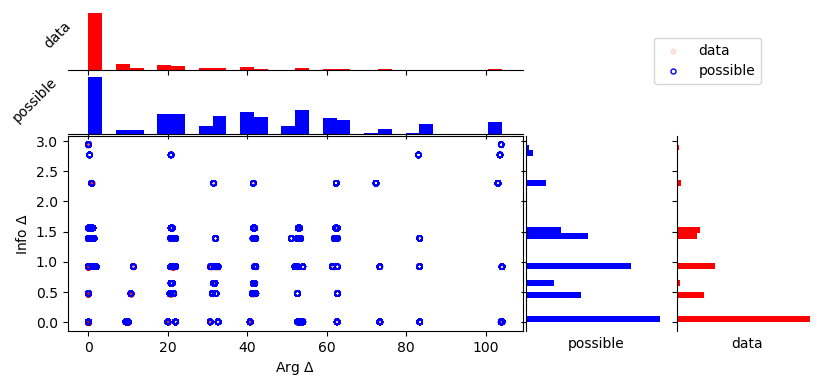

In [52]:
fig, *_ = plot_marginal_deltas(data, info_deltas, arg_deltas_high, arg_deltas_low)

fig.savefig(
    'figs/various/distributionDeltas_lr_argstrength.png', 
    dpi=300, 
    bbox_inches="tight",
    transparent=False
)

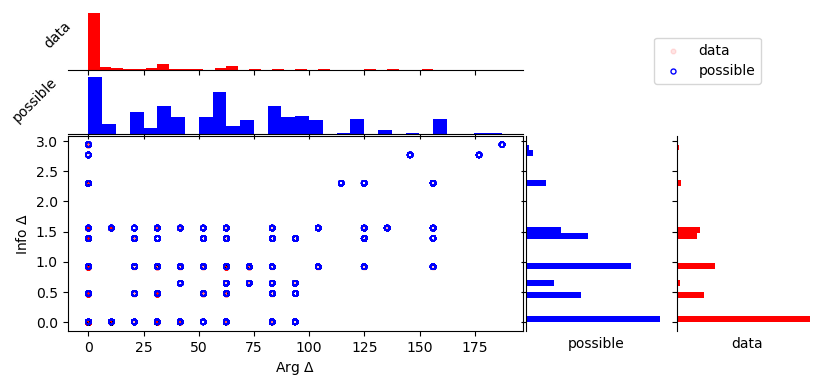

In [53]:
fig, *_ = plot_marginal_deltas(data, info_deltas, arg_maximin_deltas_high, arg_maximin_deltas_low)

fig.savefig(
    'figs/various/distributionDeltas_maximin_argstrength.png', 
    dpi=300, 
    bbox_inches="tight",
    transparent=False
)

Plot observed infodelta and argdelta for each student result array.

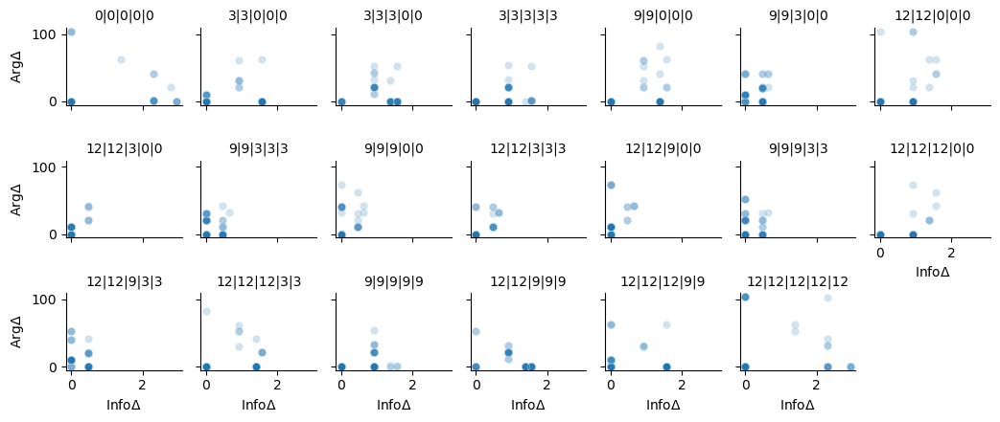

In [59]:
plot_obswise_deltas(
    data, 
    info_deltas, 
    arg_deltas_high, 
    arg_deltas_low,
    fname='figs/various/frontierobs_lr.png'
)

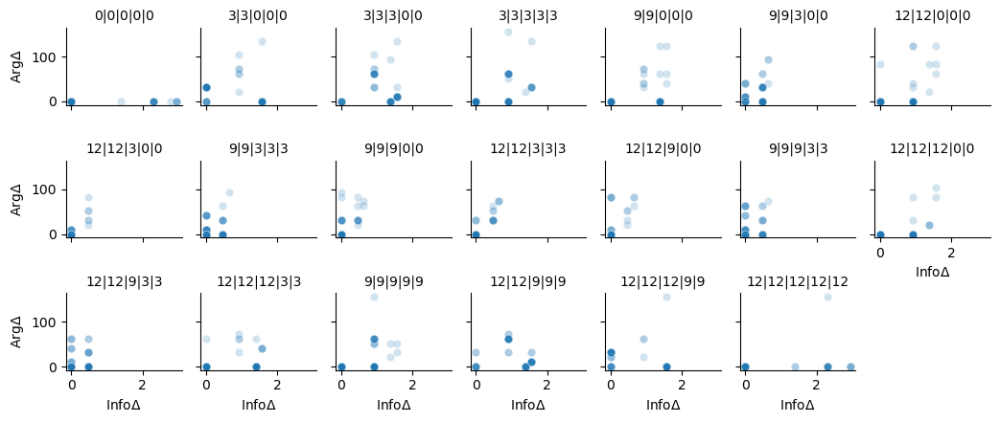

In [60]:
plot_obswise_deltas(
    data, 
    info_deltas, 
    arg_maximin_deltas_high, 
    arg_maximin_deltas_low,
    fname='figs/various/frontierobs_maximin.png'
)

### Plot tables with argdeltas, infodeltas, and counts

Plot for each observation/condition some information about (counts of observed in data, argdelta, etc)

In [1300]:
%%capture
# NOTE: capture prevents the cell from printing output 

# Calculate the infodeltas and argdeltas, and the counts of
# of utterances for each condition and observation combination.
data['infodelta'] = info_deltas[data.index_utterance, data.index_observation]
arg_deltas = np.stack((arg_deltas_low, arg_deltas_high))
data['argdelta'] = arg_deltas[data.condition, data.index_utterance, data.index_observation]
data_copy = data.copy()
data_copy['row_number'] = data['row_number'].apply(lambda x: '|'.join([str(i) for i in x]))
data_copy['response'] = data['response'].apply(lambda x: '|'.join([str(i) for i in x]))

counts = data_copy.value_counts(
    ['row_number','condition', 'response', 'infodelta', 'argdelta']
).reset_index()

xs, ys = np.mgrid[0:5,0:12]

for i, obs in enumerate(possible_observations):    
    
    fig, axes = plt.subplots(2,2)
    
    str_obs = '|'.join([str(a) for a in obs])
        
    subset_low = counts[
        (counts['row_number'] == str_obs) &
        (counts['condition'] == 1)
    ][['response', 0, 'infodelta', 'argdelta']].reset_index(drop=True)
    
    subset_high = counts[
        (counts['row_number'] == str_obs) &
        (counts['condition'] == 0)
    ][['response', 0, 'infodelta', 'argdelta']].reset_index(drop=True)
            
    axes[0,0].axis('off')
    axes[0,0].axis('tight')
    axes[0,0].table(
        cellText=subset_high.values, 
        colLabels=subset_high.columns, 
        loc='center',
        edges='vertical'
    )
    axes[0,0].set_title(
        'Low condition',
        rotation='vertical',
        x=-0.1,
        y=0.5,
        fontsize=8,
        verticalalignment='center'
    )
        
    axes[0,1].axis('off')
    axes[0,1].axis('tight')
    axes[0,1].table(
        cellText=subset_low.values,
        colLabels=subset_low.columns, 
        loc='center',
        edges='vertical'
    )
    axes[0,1].set_title(
        'High condition',
        rotation='vertical',
        x=-0.1,
        y=0.5,
        fontsize=8,
        verticalalignment='center'
    )
    
    todraw = (ys <= np.array(obs)[:,None])
    axes[1,0].imshow(todraw)
    axes[1,0].set_yticks(np.arange(5))
    axes[1,0].set_yticklabels(['Lisanne', 'Mia', 'Julia', 'Theresa', 'Julian'])
    axes[1,0].set_xticks(np.arange(13))
    axes[1,0].set_xlabel(obs)
    
    axes[1,1].axis('off')
    axes[1,1].axis('tight')

    fig.savefig(f'figs/by_observation_argdelta/{i}.png', dpi=300, facecolor='white')
    plt.close(fig)

Plot **participant-wise counts**. It is convenient to have a surveyeable visualization of the data for each participant, especially below when I add hierarchical structure.

In [481]:
for i in np.unique(data['id'].values):
    participant_data = data[data['id']==i]
    part_data = participant_data['condition'].to_frame()
    part_data['response'] = participant_data['response'].apply(lambda x: '|'.join(x))
    part_data['obs'] = ['|'.join([str(a) for a in x]) for x in participant_data['row_number']]
    part_data['obs_sum'] = [np.array(x).sum() for x in participant_data['row_number']]
    part_data.reset_index(inplace=True, drop=True)
    part_data = part_data.sort_values(by=['condition', 'obs_sum']).reset_index(drop=True)
    part_data.drop(columns='obs_sum', inplace=True)
    pos_data = part_data[part_data['condition'] == 1].drop(columns='condition')
    neg_data = part_data[part_data['condition'] == 0].drop(columns='condition')
    
    fig, (ax_pos, ax_neg) = plt.subplots(1,2)
    ax_pos.axis('off')
    ax_pos.axis('tight')
    ax_pos.table(
        cellText=pos_data.values,
        colLabels=pos_data.columns, 
        loc='center',
        edges='vertical'
    )
    ax_pos.set_title('High condition')
    
    ax_neg.axis('off')
    ax_neg.axis('tight')
    ax_neg.table(
        cellText=neg_data.values,
        colLabels=neg_data.columns, 
        loc='center',
        edges='vertical'
    )
    ax_neg.set_title('Low condition')
    
    fig.savefig(f'figs/by_participant/{i}.png', dpi=300)
    plt.close(fig)

Plot participant-wise **maximin argdelta and counts**

In [1336]:
%%capture
# NOTE: capture prevents the cell from printing output 

data['infodelta'] = info_deltas[data.index_utterance, data.index_observation]
arg_deltas = np.stack((arg_maximin_deltas_low, arg_maximin_deltas_high))
data['maximin_argdelta'] = arg_deltas[data.condition, data.index_utterance, data.index_observation]
data_copy = data.copy()
data_copy['row_number'] = data['row_number'].apply(lambda x: '|'.join([str(i) for i in x]))
data_copy['response'] = data['response'].apply(lambda x: '|'.join([str(i) for i in x]))

counts = data_copy.value_counts(
    ['row_number','condition', 'response', 'infodelta', 'maximin_argdelta']
).reset_index()

xs, ys = np.mgrid[0:5,0:12]

for i, obs in enumerate(possible_observations):    
    
    fig, axes = plt.subplots(2,2)
    
    str_obs = '|'.join([str(a) for a in obs])
        
    subset_low = counts[
        (counts['row_number'] == str_obs) &
        (counts['condition'] == 1)
    ][['response', 0, 'infodelta', 'maximin_argdelta']].reset_index(drop=True)
    
    subset_high = counts[
        (counts['row_number'] == str_obs) &
        (counts['condition'] == 0)
    ][['response', 0, 'infodelta', 'maximin_argdelta']].reset_index(drop=True)
            
    axes[0,0].axis('off')
    axes[0,0].axis('tight')
    axes[0,0].table(
        cellText=subset_high.values, 
        colLabels=subset_high.columns, 
        loc='center',
        edges='vertical'
    )
    axes[0,0].set_title(
        'Low condition',
        rotation='vertical',
        x=-0.1,
        y=0.5,
        fontsize=8,
        verticalalignment='center'
    )
        
    axes[0,1].axis('off')
    axes[0,1].axis('tight')
    axes[0,1].table(
        cellText=subset_low.values,
        colLabels=subset_low.columns, 
        loc='center',
        edges='vertical'
    )
    axes[0,1].set_title(
        'High condition',
        rotation='vertical',
        x=-0.1,
        y=0.5,
        fontsize=8,
        verticalalignment='center'
    )
    
    todraw = (ys <= np.array(obs)[:,None])
    axes[1,0].imshow(todraw)
    axes[1,0].set_yticks(np.arange(5))
    axes[1,0].set_yticklabels(['Lisanne', 'Mia', 'Julia', 'Theresa', 'Julian'])
    axes[1,0].set_xticks(np.arange(13))
    axes[1,0].set_xlabel(obs)
    
    axes[1,1].axis('off')
    axes[1,1].axis('tight')

    fig.savefig(f'figs/by_observation_maximin_argdelta/{i}.png', dpi=300, facecolor='white')
    plt.close(fig)

## Test parameter recovery for pooled models

We do parameter recovery assuming the same independent variable and number of participants as the observed pilot data.

For computational reasons we can only do parameter recovery with MAP. Since MAP is a particularly bad summary for hierarchical models, we only do parameter recovery for pooled models.

### Base RSA

In [197]:
prior_pd_base, recovered_base = parameter_recovery_MAP(model_base, 50, data)

# find the difference between the MAP parameters
# and the true parameters
differences_base = (
    pd.DataFrame({v:k for v,k in prior_pd_base.items() if v!='utterances'}) - 
    pd.DataFrame(recovered_base)
)

0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 

<AxesSubplot:ylabel='Density'>

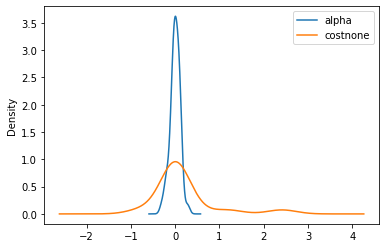

In [198]:
# plot the distribution of differences
differences_base[
    [k for k in differences_base.columns if not pm.util.is_transformed_name(k)]
].plot(kind='kde')

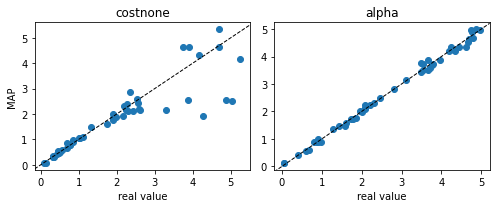

In [200]:
plot_MAP_recovery(prior_pd_base, recovered_base)

### Log-likelihood ratio argstrength RSA

In [210]:
prior_pd_lr_argstrength, recovered_lr_argstrength = parameter_recovery_MAP(
    model_lr_argstrength, 
    50, 
    data
)

0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 

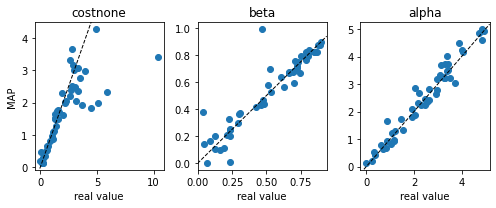

In [212]:
plot_MAP_recovery(prior_pd_lr_argstrength, recovered_lr_argstrength)

### Maximin argstrength RSA

In [213]:
prior_pd_maximin_argstrength, recovered_maximin_argstrength = parameter_recovery_MAP(
    model_maximin_argstrength, 
    50, 
    data
)

0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 

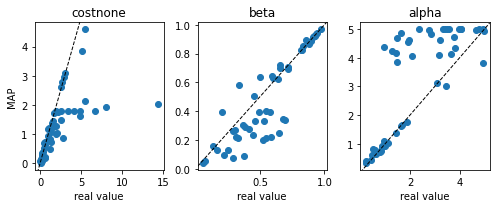

In [214]:
plot_MAP_recovery(prior_pd_maximin_argstrength, recovered_maximin_argstrength)

### $S_1$ argstrength RSA

In [215]:
prior_pd_prag_argstrength, recovered_prag_argstrength = parameter_recovery_MAP(
    model_prag_argstrength, 
    50, 
    data
)

0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 

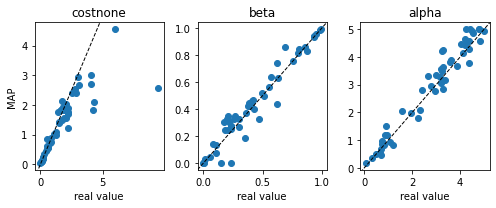

In [216]:
plot_MAP_recovery(prior_pd_prag_argstrength, recovered_prag_argstrength)

## Fit models and save traces

### Base RSA

**Completely pooled $\alpha$**

In [69]:
model_base = factory_model_base(
    data, 
    possible_observations, 
    possible_utterances
)

Defining non-hierarchical model


In [22]:
with model_base:
    trace_base = pm.sample(
        draws=1000,
        tune=1000,
        target_accept=0.95,
        return_inferencedata=True,
    )

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [costnone, alpha]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 8 seconds.


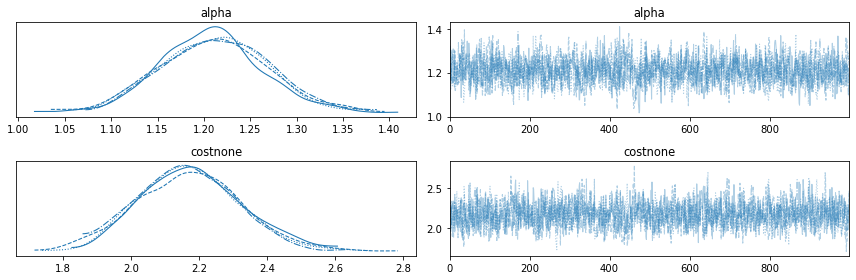

In [23]:
# run with argument strength calculated just using
# the possible observations in the experiment
az.plot_trace(trace_base)
plt.tight_layout()
plt.show()

In [37]:
save_trace(
    'base', 
    trace_base,
    path_to_folder=folder_pilot_traces
)

**By-participant $\alpha$**

In [71]:
model_base_hierarchical = factory_model_base_hierarchical(
    data, 
    possible_observations, 
    possible_utterances
)

Defining hierarchical model


In [26]:
with model_base_hierarchical:
    trace_base_hierarchical = pm.sample(
        draws=1000,
        tune=1000,
        target_accept=0.95,
        return_inferencedata=True,
    )

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [costnone, alpha_zs, alpha_sigma, alpha_mu]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 121 seconds.


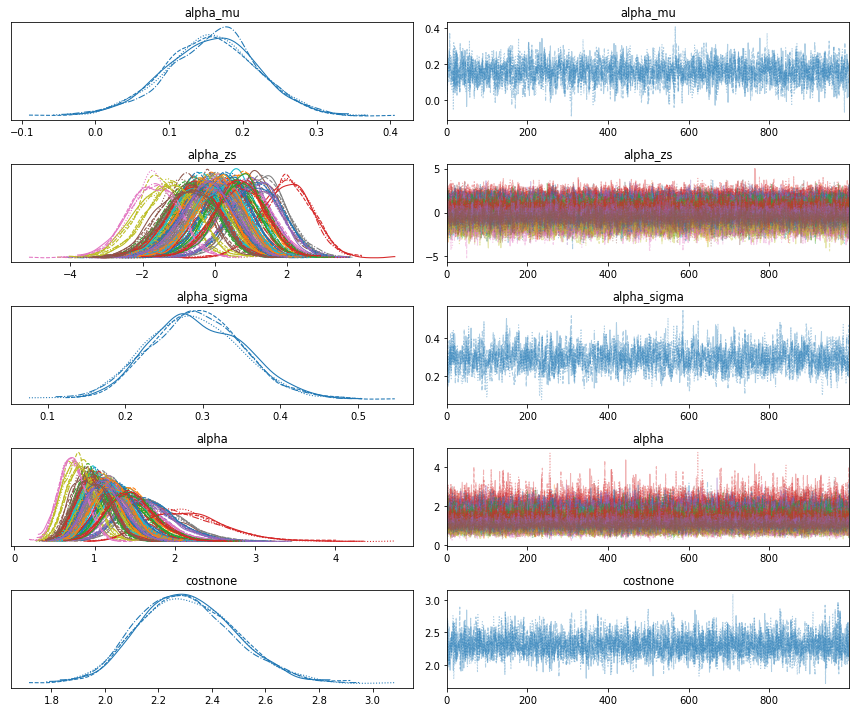

In [27]:
# run with argument strength calculated just using
# the possible observations in the experiment
az.plot_trace(trace_base_hierarchical)
plt.tight_layout()
plt.show()

In [38]:
save_trace(
    'base_hierarchical', 
    trace_base_hierarchical,
    path_to_folder=folder_pilot_traces
)

### Log-likelihood ratio argstrength RSA

**Completely pooled $\alpha$ and $\beta$**

In [72]:
model_lr_argstrength = factory_model_lr_argstrength(
    data, 
    possible_observations, 
    possible_utterances
)

Defining non-hierarchical model
Defining non-hierarchical model


In [68]:
with model_lr_argstrength:
    trace_lr_argstrength = pm.sample(
        draws=1000,
        tune=1000,
        target_accept=0.95,
        return_inferencedata=True,
    )

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [costnone, beta, alpha]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 78 seconds.
The number of effective samples is smaller than 25% for some parameters.


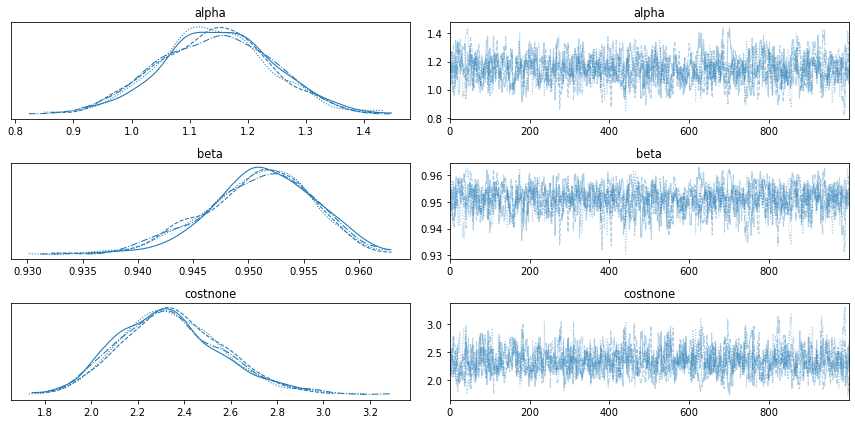

In [69]:
# run with argument strength calculated just using
# the possible observations in the experiment
az.plot_trace(trace_lr_argstrength)
plt.tight_layout()
plt.show()

In [72]:
save_trace(
    'lr_argstrength', 
    trace_lr_argstrength,
    path_to_folder=folder_pilot_traces
)

**By-participant $\alpha$, $\beta$**

In [73]:
model_lr_argstrength_hierarchical = factory_model_lr_argstrength_hierarchical(
    data, 
    possible_observations, 
    possible_utterances
)

Defining hierarchical model
Defining hierarchical model


In [41]:
with model_lr_argstrength_hierarchical:
    trace_lr_argstrength_hierarchical = pm.sample(
        draws=2000,
        tune=1000,
        target_accept=0.90,
        return_inferencedata=True,
    )

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [costnone, beta_offset, beta_sigma, beta_mu, alpha_zs, alpha_sigma, alpha_mu]


Sampling 4 chains for 1_000 tune and 2_000 draw iterations (4_000 + 8_000 draws total) took 368 seconds.
The number of effective samples is smaller than 25% for some parameters.


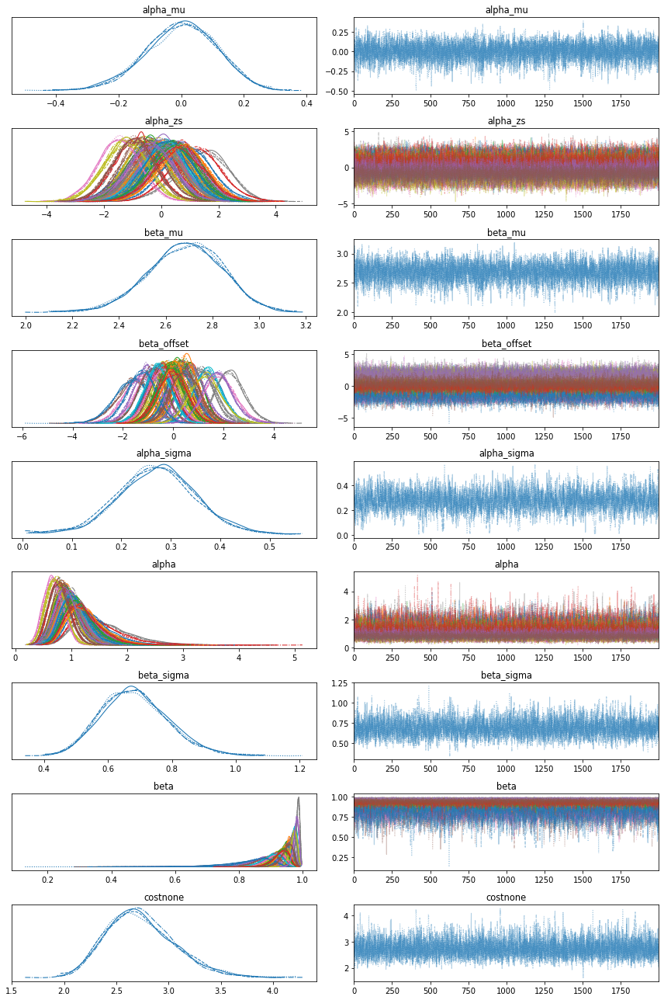

In [42]:
az.plot_trace(trace_lr_argstrength_hierarchical)
plt.tight_layout()
plt.show()

In [46]:
save_trace(
    'lr_argstrength_hierarchical', 
    trace_lr_argstrength_hierarchical,
    path_to_folder=folder_pilot_traces
)

### Maximin argstrength RSA

**Completely pooled $\alpha$ and $\beta$**

In [74]:
model_maximin_argstrength = factory_model_maximin_argstrength(
    data, 
    possible_observations, 
    possible_utterances
)

/mnt/c/Users/faust/OneDrive - UvA/research_projects/2022_arglang/arglang_modelling/functions/argstrengths.py:148: RuntimeWarning: invalid value encountered in subtract
  return np.nanmin(logp_for-logp_against, 1)


Defining non-hierarchical model
Defining non-hierarchical model


In [76]:
with model_maximin_argstrength:
    trace_maximin_argstrength = pm.sample(
        draws=2000,
        tune=1000,
        target_accept=0.90,
        return_inferencedata=True,
    )

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [costnone, beta, alpha]


Sampling 4 chains for 1_000 tune and 2_000 draw iterations (4_000 + 8_000 draws total) took 157 seconds.
The number of effective samples is smaller than 25% for some parameters.


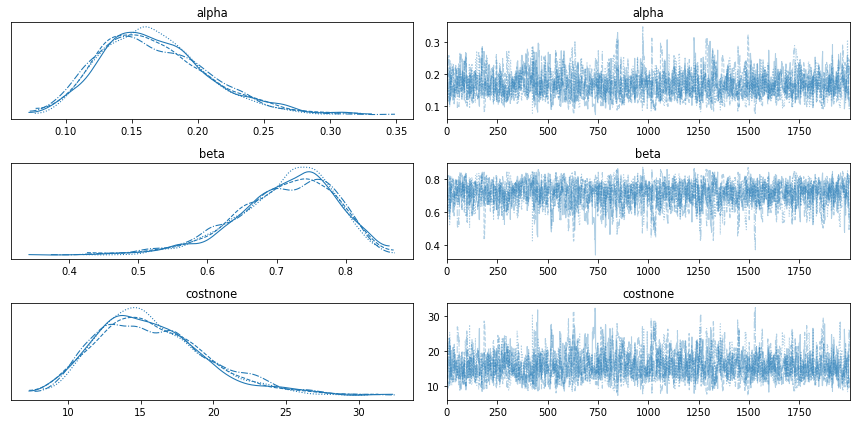

In [77]:
# run with argument strength calculated just using
# the possible observations in the experiment
az.plot_trace(trace_maximin_argstrength)
plt.tight_layout()
plt.show()

In [79]:
save_trace(
    'maximin_argstrength', 
    trace_maximin_argstrength,
    path_to_folder=folder_pilot_traces
)

**By-participant $\alpha$, $\beta$**

In [75]:
model_maximin_argstrength_hierarchical = factory_model_maximin_argstrength_hierarchical(
    data, 
    possible_observations, 
    possible_utterances
)

Defining hierarchical model
Defining hierarchical model


In [25]:
with model_maximin_argstrength_hierarchical:
    trace_maximin_argstrength_hierarchical = pm.sample(
        draws=1000,
        tune=1000,
        target_accept=0.95,
        return_inferencedata=True,
    )

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [costnone, beta_offset, beta_sigma, beta_mu, alpha_zs, alpha_sigma, alpha_mu]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 500 seconds.
The number of effective samples is smaller than 25% for some parameters.


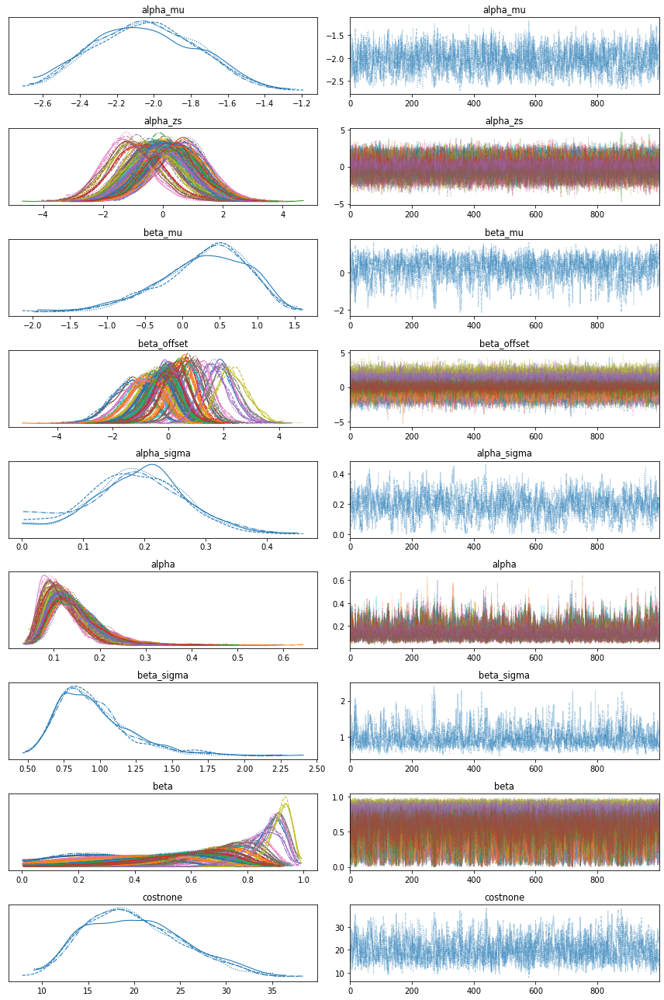

In [26]:
az.plot_trace(trace_maximin_argstrength_hierarchical)
plt.tight_layout()
plt.show()

In [29]:
save_trace(
    'maximin_argstrength_hierarchical', 
    trace_maximin_argstrength_hierarchical,
    path_to_folder=folder_pilot_traces
)

### $S_1$ argstrength

**Completely pooled $\alpha$ and $\beta$**

In [80]:
model_prag_argstrength = factory_model_prag_argstrength(
    data, 
    possible_observations, 
    possible_utterances
)

Defining non-hierarchical model
Defining non-hierarchical model
Defining non-hierarchical model
Defining non-hierarchical model


In [35]:
with model_prag_argstrength:
    trace_prag_argstrength = pm.sample(
        draws=3000,
        tune=2000,
        target_accept=0.95,
        return_inferencedata=True
    )

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [costnone, beta, alpha]


Sampling 4 chains for 2_000 tune and 3_000 draw iterations (8_000 + 12_000 draws total) took 148 seconds.
The number of effective samples is smaller than 25% for some parameters.


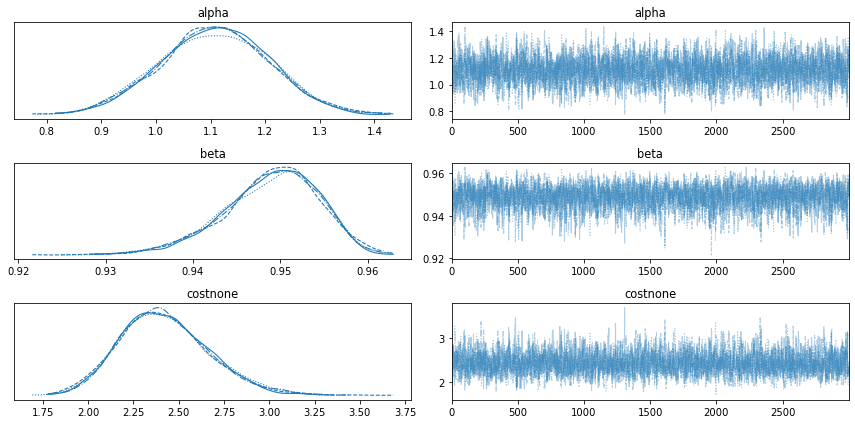

In [36]:
az.plot_trace(trace_prag_argstrength)
plt.tight_layout()

In [38]:
save_trace(
    'prag_argstrength', 
    trace_prag_argstrength,
    path_to_folder=folder_pilot_traces
)

**By-participant $\alpha$ and $\beta$**

In [84]:
model_prag_argstrength_hierarchical = factory_model_prag_argstrength_hierarchical(
    data, 
    possible_observations, 
    possible_utterances
)

Defining hierarchical model
Defining hierarchical model
Defining hierarchical model
Defining hierarchical model


In [31]:
with model_prag_argstrength_hierarchical:
    trace_prag_argstrength_hierarchical = pm.sample(
        draws=2000,
        tune=1000,
        target_accept=0.95,
        return_inferencedata=True
    )

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [costnone, beta_offset, beta_sigma, beta_mu, alpha_zs, alpha_sigma, alpha_mu]


Sampling 4 chains for 1_000 tune and 2_000 draw iterations (4_000 + 8_000 draws total) took 553 seconds.
The number of effective samples is smaller than 25% for some parameters.


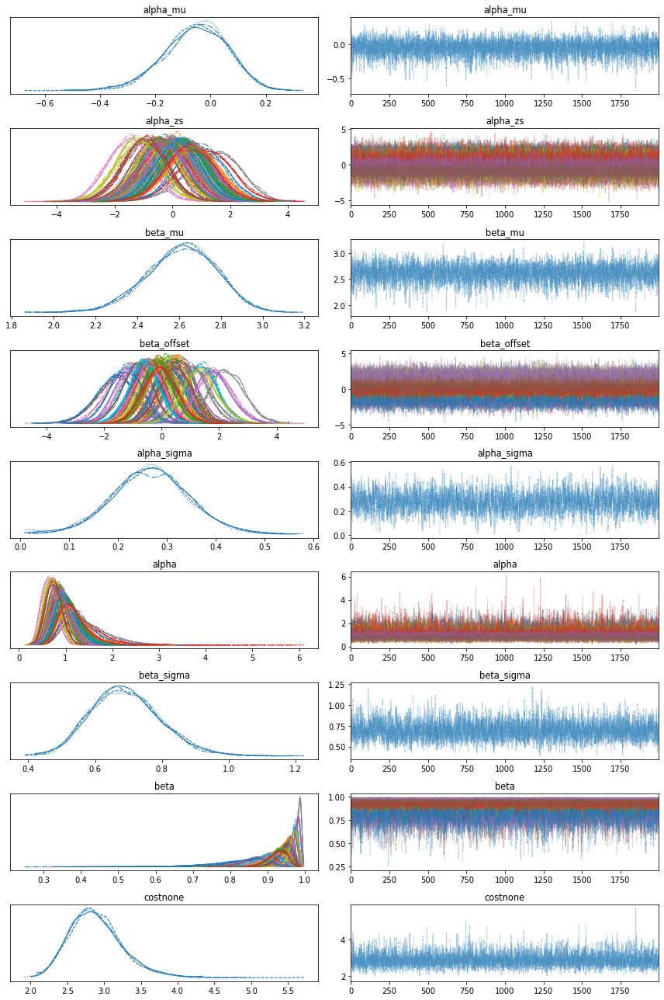

In [32]:
az.plot_trace(trace_prag_argstrength_hierarchical)
plt.tight_layout()

In [33]:
save_trace(
    'prag_argstrength_hierarchical', 
    trace_prag_argstrength_hierarchical,
    path_to_folder=folder_pilot_traces
)

## Get stored traces (after fitting)

In [88]:
pilot_traces = get_traces(folder_pilot_traces)

Getting  base
Objects for base not yet defined, attempting from file
Objects for base loaded from file

Getting  base_hierarchical
Objects for base_hierarchical not yet defined, attempting from file
Objects for base_hierarchical loaded from file

Getting  lr_argstrength
Objects for lr_argstrength not yet defined, attempting from file
Objects for lr_argstrength loaded from file

Getting  lr_argstrength_hierarchical
Objects for lr_argstrength_hierarchical not yet defined, attempting from file
Objects for lr_argstrength_hierarchical loaded from file

Getting  maximin_argstrength
Objects for maximin_argstrength not yet defined, attempting from file
Objects for maximin_argstrength loaded from file

Getting  maximin_argstrength_hierarchical
Objects for maximin_argstrength_hierarchical not yet defined, attempting from file
Objects for maximin_argstrength_hierarchical loaded from file

Getting  prag_argstrength
Objects for prag_argstrength not yet defined, attempting from file
Objects for prag

In [89]:
{k:v.observed_data.utterances_dim_0.values.shape for k,v in pilot_traces.items()}

{'base': (1060,),
 'base_hierarchical': (1060,),
 'lr_argstrength': (1060,),
 'lr_argstrength_hierarchical': (1060,),
 'maximin_argstrength': (1060,),
 'maximin_argstrength_hierarchical': (1060,),
 'prag_argstrength': (1060,),
 'prag_argstrength_hierarchical': (1060,)}

In [94]:
trace_base = pilot_traces['base']
trace_base_hierarchical = pilot_traces['base_hierarchical']
trace_lr_argstrength = pilot_traces['lr_argstrength']
trace_lr_argstrength_hierarchical = pilot_traces['lr_argstrength_hierarchical']
trace_maximin_argstrength = pilot_traces['maximin_argstrength']
trace_maximin_argstrength_hierarchical = pilot_traces['maximin_argstrength_hierarchical']
trace_prag_argstrength = pilot_traces['prag_argstrength']
trace_prag_argstrength_hierarchical = pilot_traces['prag_argstrength_hierarchical']

## Posterior predictive p-values

### Base RSA

**Completely pooled $\alpha$**

In [358]:
# Sample utterances in the same conditions as the experiment.
# Contains sampled utterances for each trial for each trace sample.
# Each row is a simulated experiment the array contains
# the index of the produced utterance in each trial
pps_base = pm.sample_posterior_predictive(
    trace_base,
    model=model_base,
    # keep_size=True
)['utterances']

In [361]:
posterior_p_samples_base = calculate_bayesian_posterior_pvalue(
    trace_base, 
    pps_base, 
    model_base
)

0, 100, 200, 300, 400, 500, 600, 700, 800, 900, 1000, 1100, 1200, 1300, 1400, 1500, 1600, 1700, 1800, 1900, 2000, 2100, 2200, 2300, 2400, 2500, 2600, 2700, 2800, 2900, 3000, 3100, 3200, 3300, 3400, 3500, 3600, 3700, 3800, 3900, 

In [362]:
posterior_p_samples_base

0.4785

**By-participant $\alpha$**

In [220]:
pps_base_hierarchical = pm.sample_posterior_predictive(
    trace_base_hierarchical,
    # samples=10000,
    model=model_base_hierarchical
)['utterances']

In [222]:
posterior_p_samples_base_hierarchical = calculate_bayesian_posterior_pvalue(
    trace_base_hierarchical, 
    pps_base_hierarchical, 
    model_base_hierarchical,
    # pointwise=True
)

0, 100, 200, 300, 400, 500, 600, 700, 800, 900, 1000, 1100, 1200, 1300, 1400, 1500, 1600, 1700, 1800, 1900, 2000, 2100, 2200, 2300, 2400, 2500, 2600, 2700, 2800, 2900, 3000, 3100, 3200, 3300, 3400, 3500, 3600, 3700, 3800, 3900, 

In [223]:
posterior_p_samples_base_hierarchical

0.48475

### Log-likelihood ratio argstrength RSA

**Completely pooled $\alpha$ and $\beta$**

In [224]:
pps_lr_argstrength = pm.sample_posterior_predictive(
    trace_lr_argstrength,
    # samples=10000,
    model=model_lr_argstrength
)['utterances']

In [225]:
posterior_p_samples_lr_argstrength = calculate_bayesian_posterior_pvalue(
    trace_lr_argstrength, 
    pps_lr_argstrength, 
    model_lr_argstrength,
    # pointwise=True
)

0, 100, 200, 300, 400, 500, 600, 700, 800, 900, 1000, 1100, 1200, 1300, 1400, 1500, 1600, 1700, 1800, 1900, 2000, 2100, 2200, 2300, 2400, 2500, 2600, 2700, 2800, 2900, 3000, 3100, 3200, 3300, 3400, 3500, 3600, 3700, 3800, 3900, 

In [226]:
posterior_p_samples_lr_argstrength

0.4985

**By-participant $\alpha$, $\beta$**

In [227]:
pps_lr_argstrength_hierarchical = pm.sample_posterior_predictive(
    trace_lr_argstrength_hierarchical,
    # samples=10000,
    model=model_lr_argstrength_hierarchical
)['utterances']

In [230]:
posterior_p_samples_lr_argstrength_hierarchical = calculate_bayesian_posterior_pvalue(
    trace_lr_argstrength_hierarchical, 
    pps_lr_argstrength_hierarchical, 
    model_lr_argstrength_hierarchical,
    # pointwise=True
)

0, 100, 200, 300, 400, 500, 600, 700, 800, 900, 1000, 1100, 1200, 1300, 1400, 1500, 1600, 1700, 1800, 1900, 2000, 2100, 2200, 2300, 2400, 2500, 2600, 2700, 2800, 2900, 3000, 3100, 3200, 3300, 3400, 3500, 3600, 3700, 3800, 3900, 4000, 4100, 4200, 4300, 4400, 4500, 4600, 4700, 4800, 4900, 5000, 5100, 5200, 5300, 5400, 5500, 5600, 5700, 5800, 5900, 6000, 6100, 6200, 6300, 6400, 6500, 6600, 6700, 6800, 6900, 7000, 7100, 7200, 7300, 7400, 7500, 7600, 7700, 7800, 7900, 

In [231]:
posterior_p_samples_lr_argstrength_hierarchical

0.48375

### Maximin argstrength RSA

**Completely pooled $\alpha$ and $\beta$**

In [234]:
pps_maximin_argstrength = pm.sample_posterior_predictive(
    trace_maximin_argstrength,
    # samples=10000,
    model=model_maximin_argstrength
)['utterances']

In [235]:
posterior_p_samples_maximin_argstrength = calculate_bayesian_posterior_pvalue(
    trace_maximin_argstrength, 
    pps_maximin_argstrength, 
    model_maximin_argstrength,
    # pointwise=True
)

0, 100, 200, 300, 400, 500, 600, 700, 800, 900, 1000, 1100, 1200, 1300, 1400, 1500, 1600, 1700, 1800, 1900, 2000, 2100, 2200, 2300, 2400, 2500, 2600, 2700, 2800, 2900, 3000, 3100, 3200, 3300, 3400, 3500, 3600, 3700, 3800, 3900, 4000, 4100, 4200, 4300, 4400, 4500, 4600, 4700, 4800, 4900, 5000, 5100, 5200, 5300, 5400, 5500, 5600, 5700, 5800, 5900, 6000, 6100, 6200, 6300, 6400, 6500, 6600, 6700, 6800, 6900, 7000, 7100, 7200, 7300, 7400, 7500, 7600, 7700, 7800, 7900, 8000, 8100, 8200, 8300, 8400, 8500, 8600, 8700, 8800, 8900, 9000, 9100, 9200, 9300, 9400, 9500, 9600, 9700, 9800, 9900, 10000, 10100, 10200, 10300, 10400, 10500, 10600, 10700, 10800, 10900, 11000, 11100, 11200, 11300, 11400, 11500, 11600, 11700, 11800, 11900, 

In [236]:
posterior_p_samples_maximin_argstrength

0.49083333333333334

**By-participant $\alpha$, $\beta$**

In [237]:
pps_maximin_argstrength_hierarchical = pm.sample_posterior_predictive(
    trace_maximin_argstrength_hierarchical,
    model=model_maximin_argstrength_hierarchical
)['utterances']

In [238]:
posterior_p_samples_maximin_argstrength_hierarchical = calculate_bayesian_posterior_pvalue(
    trace_maximin_argstrength_hierarchical, 
    pps_maximin_argstrength_hierarchical, 
    model_maximin_argstrength_hierarchical,
    # pointwise=True
)

0, 100, 200, 300, 400, 500, 600, 700, 800, 900, 1000, 1100, 1200, 1300, 1400, 1500, 1600, 1700, 1800, 1900, 2000, 2100, 2200, 2300, 2400, 2500, 2600, 2700, 2800, 2900, 3000, 3100, 3200, 3300, 3400, 3500, 3600, 3700, 3800, 3900, 4000, 4100, 4200, 4300, 4400, 4500, 4600, 4700, 4800, 4900, 5000, 5100, 5200, 5300, 5400, 5500, 5600, 5700, 5800, 5900, 6000, 6100, 6200, 6300, 6400, 6500, 6600, 6700, 6800, 6900, 7000, 7100, 7200, 7300, 7400, 7500, 7600, 7700, 7800, 7900, 

In [239]:
posterior_p_samples_maximin_argstrength_hierarchical

0.476375

### $S_1$ argstrength RSA

**Completely pooled $\alpha$ and $\beta$**

In [240]:
pps_prag_argstrength = pm.sample_posterior_predictive(
    trace_prag_argstrength,
    # samples=10000,
    model=model_prag_argstrength
)['utterances']

In [241]:
posterior_p_samples_prag_argstrength = calculate_bayesian_posterior_pvalue(
    trace_prag_argstrength, 
    pps_prag_argstrength, 
    model_prag_argstrength,
    # pointwise=True
)

0, 100, 200, 300, 400, 500, 600, 700, 800, 900, 1000, 1100, 1200, 1300, 1400, 1500, 1600, 1700, 1800, 1900, 2000, 2100, 2200, 2300, 2400, 2500, 2600, 2700, 2800, 2900, 3000, 3100, 3200, 3300, 3400, 3500, 3600, 3700, 3800, 3900, 4000, 4100, 4200, 4300, 4400, 4500, 4600, 4700, 4800, 4900, 5000, 5100, 5200, 5300, 5400, 5500, 5600, 5700, 5800, 5900, 6000, 6100, 6200, 6300, 6400, 6500, 6600, 6700, 6800, 6900, 7000, 7100, 7200, 7300, 7400, 7500, 7600, 7700, 7800, 7900, 8000, 8100, 8200, 8300, 8400, 8500, 8600, 8700, 8800, 8900, 9000, 9100, 9200, 9300, 9400, 9500, 9600, 9700, 9800, 9900, 10000, 10100, 10200, 10300, 10400, 10500, 10600, 10700, 10800, 10900, 11000, 11100, 11200, 11300, 11400, 11500, 11600, 11700, 11800, 11900, 

In [242]:
posterior_p_samples_prag_argstrength

0.5365

**By-participant $\alpha$ and $\beta$**

In [243]:
pps_prag_argstrength_hierarchical = pm.sample_posterior_predictive(
    trace_prag_argstrength_hierarchical,
    # samples=10000,
    model=model_prag_argstrength_hierarchical
)['utterances']

In [244]:
posterior_p_samples_prag_argstrength_hierarchical = calculate_bayesian_posterior_pvalue(
    trace_prag_argstrength_hierarchical, 
    pps_prag_argstrength_hierarchical, 
    model_prag_argstrength_hierarchical,
    # pointwise=True
)

0, 100, 200, 300, 400, 500, 600, 700, 800, 900, 1000, 1100, 1200, 1300, 1400, 1500, 1600, 1700, 1800, 1900, 2000, 2100, 2200, 2300, 2400, 2500, 2600, 2700, 2800, 2900, 3000, 3100, 3200, 3300, 3400, 3500, 3600, 3700, 3800, 3900, 4000, 4100, 4200, 4300, 4400, 4500, 4600, 4700, 4800, 4900, 5000, 5100, 5200, 5300, 5400, 5500, 5600, 5700, 5800, 5900, 6000, 6100, 6200, 6300, 6400, 6500, 6600, 6700, 6800, 6900, 7000, 7100, 7200, 7300, 7400, 7500, 7600, 7700, 7800, 7900, 8000, 8100, 8200, 8300, 8400, 8500, 8600, 8700, 8800, 8900, 9000, 9100, 9200, 9300, 9400, 9500, 9600, 9700, 9800, 9900, 10000, 10100, 10200, 10300, 10400, 10500, 10600, 10700, 10800, 10900, 11000, 11100, 11200, 11300, 11400, 11500, 11600, 11700, 11800, 11900, 

In [245]:
posterior_p_samples_prag_argstrength_hierarchical

0.5144166666666666

## Model comparison

**Pooled models**

In [38]:
loo_comparison_pooled = az.compare(
    {
        'base': trace_base,
        'lr argstrength': trace_lr_argstrength,
        'maximin argstrength': trace_maximin_argstrength,
        'prag argstrength': trace_prag_argstrength
    }
)

<Axes: title={'center': 'Model comparison\nhigher is better'}, xlabel='elpd_loo (log)', ylabel='ranked models'>

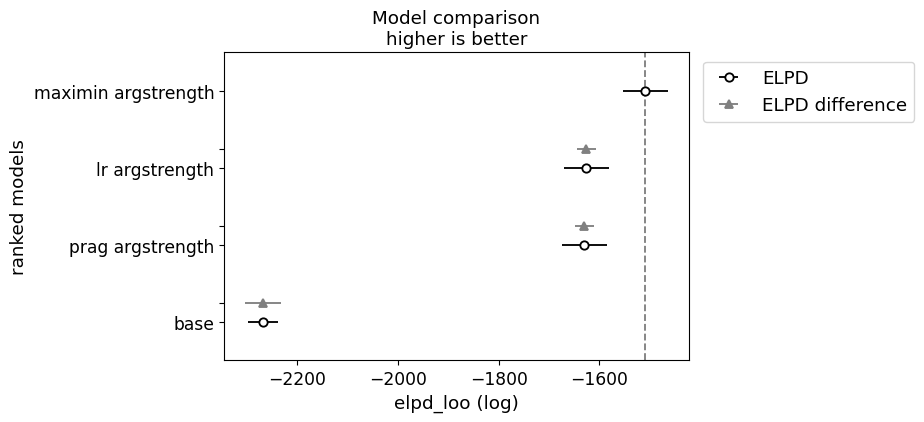

In [99]:
az.plot_compare(loo_comparison_pooled)

In [85]:
loo_comparison_pooled

,rank,loo,p_loo,d_loo,weight,se,dse,warning,loo_scale
maximin_argstrength,0,-1508.336846,2.657571,0.000000,0.876266,44.874333,0.000000,False,log
lr_argstrength,1,-1625.371532,4.361852,117.034686,0.090706,45.108843,18.597785,False,log
prag_argstrength,2,-1629.458150,4.488830,121.121304,0.000000,45.052881,18.880828,False,log
base,3,-2267.603959,2.258146,759.267113,0.033028,30.172413,36.049493,False,log


**Hierarchical models**

In [101]:
loo_comparison_hierarchical = az.compare(
    {
        'base hierarchical': trace_base_hierarchical,
        'lr argstrength hierarchical': trace_lr_argstrength_hierarchical,
        'maximin argstrength hierarchical': trace_maximin_argstrength_hierarchical,
        'prag argstrength hierarchical': trace_prag_argstrength_hierarchical
    }
)

/home/fausto/anaconda3/envs/argumentative_language/lib/python3.8/site-packages/arviz/stats/stats.py:803: UserWarning: Estimated shape parameter of Pareto distribution is greater than 0.7 for one or more samples. You should consider using a more robust model, this is because importance sampling is less likely to work well if the marginal posterior and LOO posterior are very different. This is more likely to happen with a non-robust model and highly influential observations.
  warnings.warn(
/home/fausto/anaconda3/envs/argumentative_language/lib/python3.8/site-packages/arviz/stats/stats.py:803: UserWarning: Estimated shape parameter of Pareto distribution is greater than 0.7 for one or more samples. You should consider using a more robust model, this is because importance sampling is less likely to work well if the marginal posterior and LOO posterior are very different. This is more likely to happen with a non-robust model and highly influential observations.
  warnings.warn(
/home/faus

<Axes: title={'center': 'Model comparison\nhigher is better'}, xlabel='elpd_loo (log)', ylabel='ranked models'>

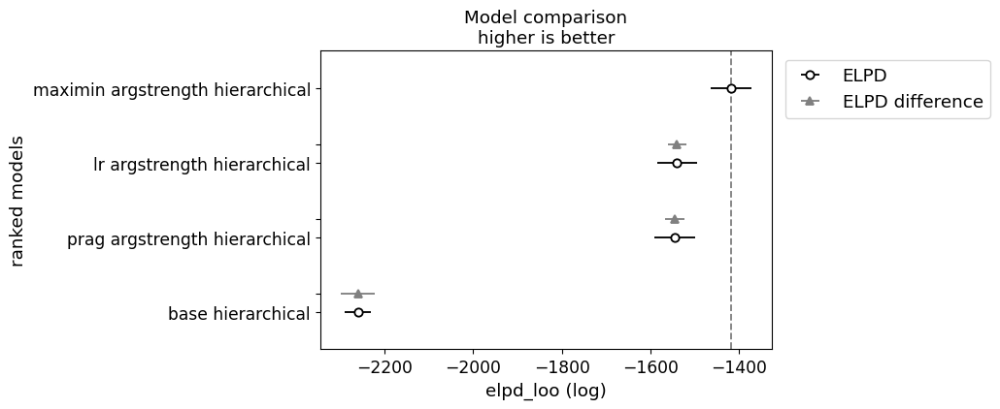

In [102]:
az.plot_compare(loo_comparison_hierarchical)

In [53]:
loo_comparison_hierarchical

,rank,loo,p_loo,d_loo,weight,se,dse,warning,loo_scale
maximin_argstrength_hierarchical,0,-1418.254588,68.249806,0.000000,8.105245e-01,45.111557,0.000000,True,log
lr_argstrength_hierarchical,1,-1540.072006,78.041003,121.817418,1.671916e-01,45.625240,21.734053,True,log
prag_argstrength_hierarchical,2,-1544.935748,78.677398,126.681160,1.455350e-14,45.692686,22.025252,True,log
base_hierarchical,3,-2260.305182,36.243164,842.050595,2.228389e-02,30.321230,38.646686,False,log


# Analysis of experiment 1

## Get experiment data

In [12]:
folder_exp1_traces = '../../arglang_model_fitting/experiment1_traces'
folder_exp1_data = '../../arglang_exp/data_experiment1/data.csv'
folder_exp1_cleaned_data = '../data/data_experiment1/'

In [13]:
if exists(folder_pilot_data):
    exp1_data = get_and_clean_data_exp1(pathdata=folder_exp1_data)
    _, data, possible_observations, possible_utterances = exp1_data
    data.to_csv(join(folder_exp1_cleaned_data, 'cleaned_data.csv'), index=False)
    pd.DataFrame(possible_observations).to_csv(join(folder_exp1_cleaned_data, 'obs.csv'), index=False)
    pd.DataFrame(possible_utterances).to_csv(join(folder_exp1_cleaned_data, 'utts.csv'), index=False)
else:
    # read the pre-cleaned data
    data = pd.read_csv(join(folder_exp1_cleaned_data, 'cleaned_data.csv'))
    possible_observations = pd.read_csv(join(folder_exp1_cleaned_data, 'obs.csv')).to_numpy()
    possible_utterances = pd.read_csv(join(folder_exp1_cleaned_data, 'utts.csv')).to_numpy()

0  were excluded because incompletely recorded
4  of the participants were excluded as they gave more than 4 false responses
48  of the observations in the included participants were excluded because literally false


/mnt/c/Users/faust/OneDrive - UvA/research_projects/2022_arglang/arglang_modelling/modeling/functions/data_functions.py:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data.rename(columns={
/mnt/c/Users/faust/OneDrive - UvA/research_projects/2022_arglang/arglang_modelling/modeling/functions/data_functions.py:54: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data.loc[:,'response'] = data.response.str.lower()
/mnt/c/Users/faust/OneDrive - UvA/research_projects/2022_arglang/arglang_modelling/modeling/functions/data_functions.py:58: SettingWithCopyWarning: 
A value

## Fit models and save traces

### Base RSA

Completely pooled $\alpha$

In [93]:
model_base = factory_model_base(
    data, 
    possible_observations, 
    possible_utterances
)

Defining non-hierarchical model


In [94]:
with model_base:
    trace_base = pm.sample(
        draws=1000,
        tune=1000,
        target_accept=0.95,
        return_inferencedata=True,
    )

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [costnone, alpha]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 15 seconds.


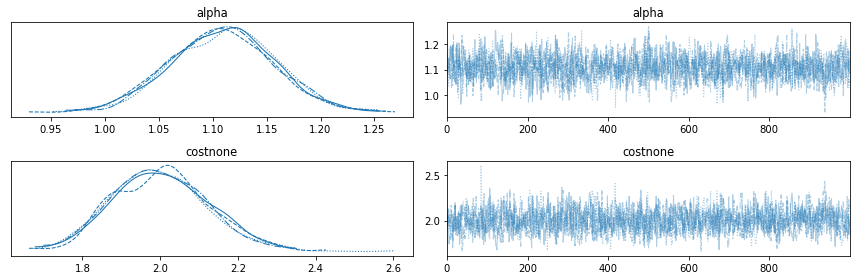

In [95]:
# run with argument strength calculated just using
# the possible observations in the experiment
az.plot_trace(trace_base)
plt.tight_layout()
plt.show()

In [96]:
save_trace(
    'base', 
    trace_base,
    path_to_folder=folder_exp1_traces
)

By-participant $\alpha$

In [97]:
model_base_hierarchical = factory_model_base_hierarchical(
    data, 
    possible_observations, 
    possible_utterances
)

Defining hierarchical model


In [98]:
with model_base_hierarchical:
    trace_base_hierarchical = pm.sample(
        draws=1000,
        tune=1000,
        target_accept=0.95,
        return_inferencedata=True,
    )

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [costnone, alpha_zs, alpha_sigma, alpha_mu]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 266 seconds.


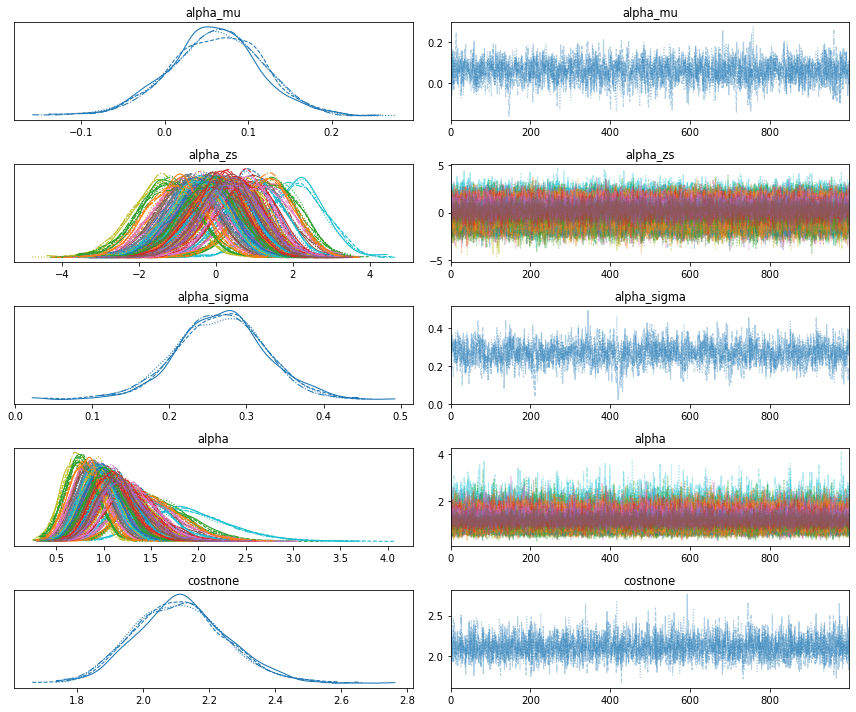

In [99]:
# run with argument strength calculated just using
# the possible observations in the experiment
az.plot_trace(trace_base_hierarchical)
plt.tight_layout()
plt.show()

In [100]:
save_trace(
    'base_hierarchical', 
    trace_base_hierarchical,
    path_to_folder=folder_exp1_traces
)

### Log-likelihood ratio argstrength RSA

Completely pooled $\alpha$ and $\beta$

In [101]:
model_lr_argstrength = factory_model_lr_argstrength(
    data, 
    possible_observations, 
    possible_utterances
)

Defining non-hierarchical model
Defining non-hierarchical model


In [102]:
with model_lr_argstrength:
    trace_lr_argstrength = pm.sample(
        draws=1000,
        tune=1000,
        target_accept=0.95,
        return_inferencedata=True,
    )

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [costnone, beta, alpha]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 103 seconds.


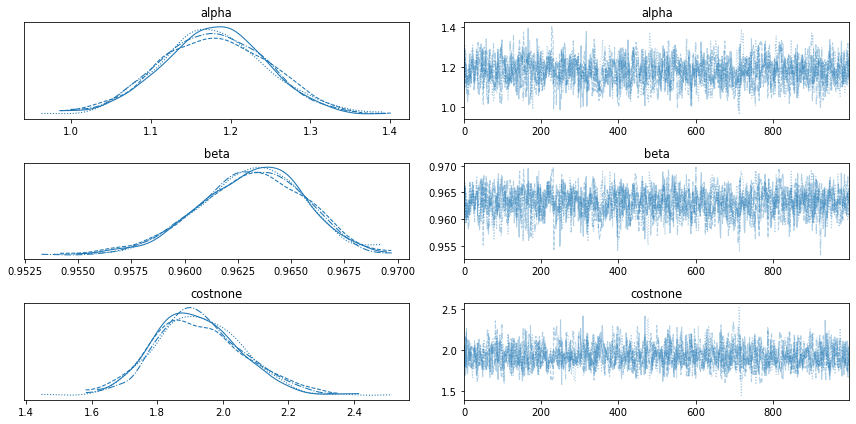

In [103]:
# run with argument strength calculated just using
# the possible observations in the experiment
az.plot_trace(trace_lr_argstrength)
plt.tight_layout()
plt.show()

In [104]:
save_trace(
    'lr_argstrength', 
    trace_lr_argstrength,
    path_to_folder=folder_exp1_traces
)

By-participant $\alpha$, $\beta$

In [105]:
model_lr_argstrength_hierarchical = factory_model_lr_argstrength_hierarchical(
    data, 
    possible_observations, 
    possible_utterances
)

Defining hierarchical model
Defining hierarchical model


In [106]:
with model_lr_argstrength_hierarchical:
    trace_lr_argstrength_hierarchical = pm.sample(
        draws=1000,
        tune=1000,
        target_accept=0.95,
        return_inferencedata=True,
    )

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [costnone, beta_offset, beta_sigma, beta_mu, alpha_zs, alpha_sigma, alpha_mu]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 635 seconds.
The number of effective samples is smaller than 25% for some parameters.


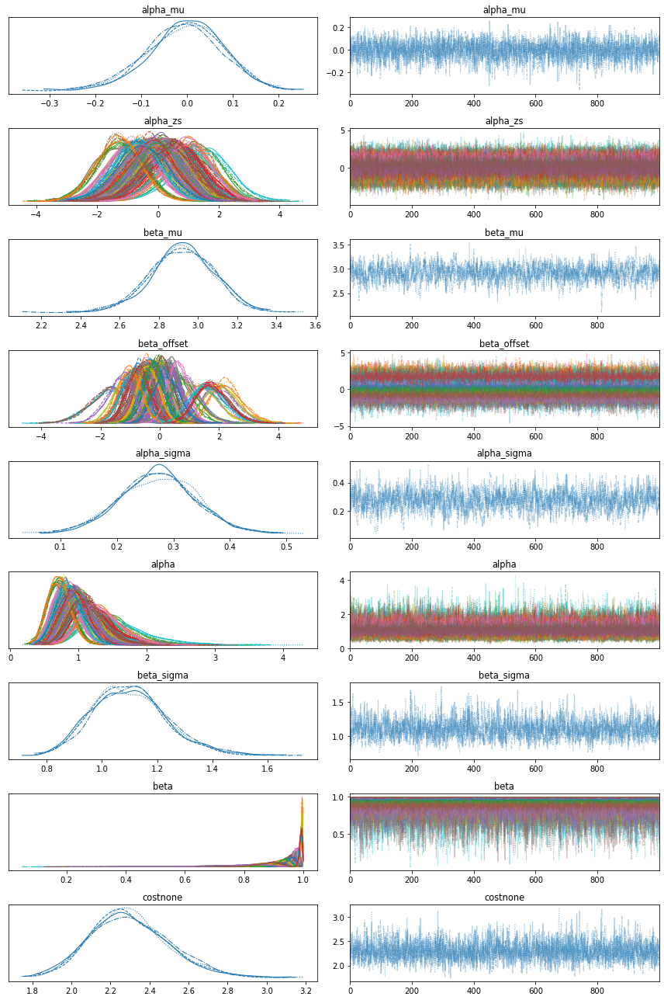

In [107]:
az.plot_trace(trace_lr_argstrength_hierarchical)
plt.tight_layout()
plt.show()

In [110]:
save_trace(
    'lr_argstrength_hierarchical', 
    trace_lr_argstrength_hierarchical,
    path_to_folder=folder_exp1_traces
)

### Maximin argstrength RSA

Completely pooled $\alpha$ and $\beta$

In [111]:
model_maximin_argstrength = factory_model_maximin_argstrength(
    data, 
    possible_observations, 
    possible_utterances
)

/tmp/ipykernel_782/278256974.py:58: RuntimeWarning: invalid value encountered in subtract
  return np.nanmin(logp_for-logp_against, 1)


Defining non-hierarchical model
Defining non-hierarchical model


In [112]:
with model_maximin_argstrength:
    trace_maximin_argstrength = pm.sample(
        draws=2000,
        tune=1000,
        target_accept=0.95,
        return_inferencedata=True,
    )

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [costnone, beta, alpha]


Sampling 4 chains for 1_000 tune and 2_000 draw iterations (4_000 + 8_000 draws total) took 330 seconds.
The number of effective samples is smaller than 25% for some parameters.


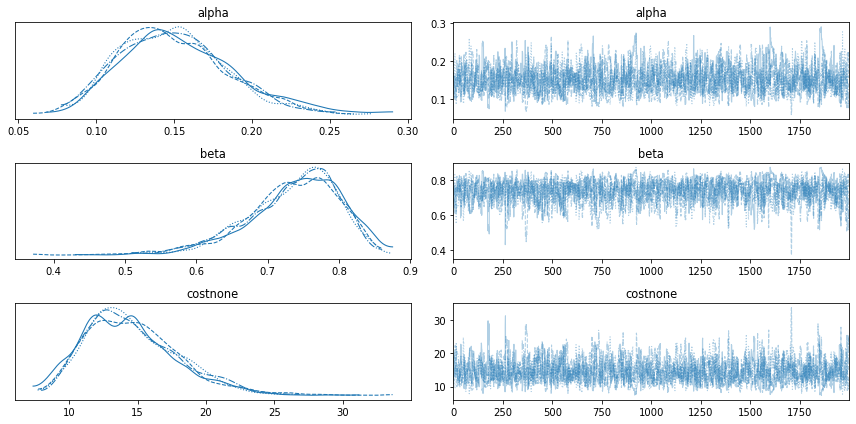

In [113]:
# run with argument strength calculated just using
# the possible observations in the experiment
az.plot_trace(trace_maximin_argstrength)
plt.tight_layout()
plt.show()

In [114]:
save_trace(
    'maximin_argstrength', 
    trace_maximin_argstrength,
    path_to_folder=folder_exp1_traces
)

By-participant $\alpha$, $\beta$

In [119]:
model_maximin_argstrength_hierarchical = factory_model_maximin_argstrength_hierarchical(
    data, 
    possible_observations, 
    possible_utterances
)

/tmp/ipykernel_782/278256974.py:58: RuntimeWarning: invalid value encountered in subtract
  return np.nanmin(logp_for-logp_against, 1)


Defining hierarchical model
Defining hierarchical model


In [120]:
with model_maximin_argstrength_hierarchical:
    trace_maximin_argstrength_hierarchical = pm.sample(
        draws=1000,
        tune=1000,
        target_accept=0.99,
        return_inferencedata=True,
    )

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [costnone, beta_offset, beta_sigma, beta_mu, alpha_zs, alpha_sigma, alpha_mu]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 2420 seconds.
The number of effective samples is smaller than 25% for some parameters.


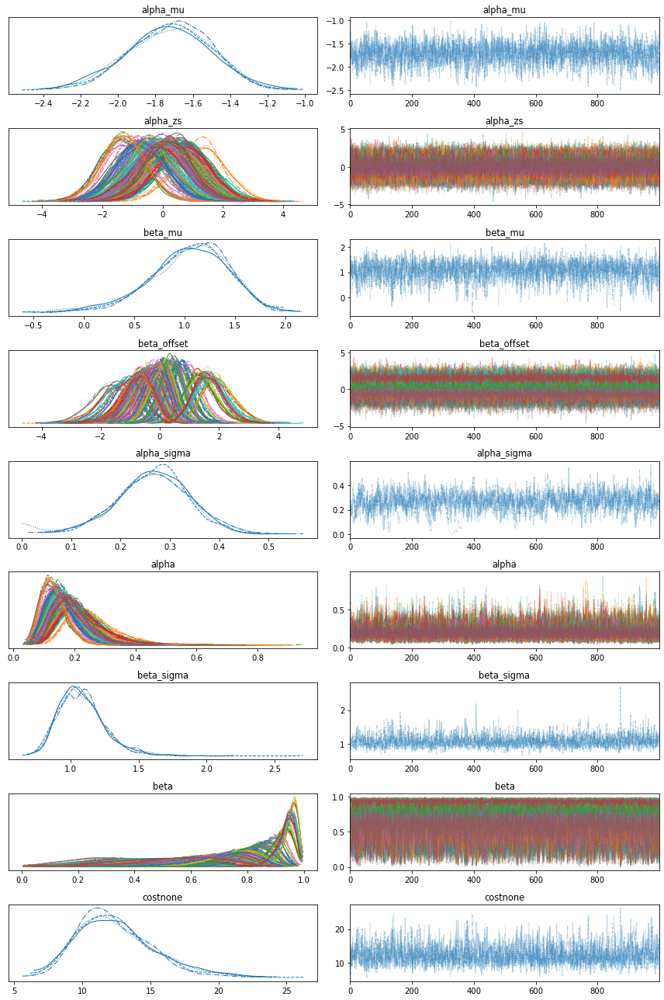

In [121]:
az.plot_trace(trace_maximin_argstrength_hierarchical)
plt.tight_layout()
plt.show()

In [124]:
save_trace(
    'maximin_argstrength_hierarchical', 
    trace_maximin_argstrength_hierarchical,
    path_to_folder=folder_exp1_traces
)

### $S_1$ argstrength

Completely pooled $\alpha$ and $\beta$

In [125]:
model_prag_argstrength = factory_model_prag_argstrength(
    data, 
    possible_observations, 
    possible_utterances
)

Defining non-hierarchical model
Defining non-hierarchical model
Defining non-hierarchical model
Defining non-hierarchical model


In [126]:
with model_prag_argstrength:
    trace_prag_argstrength = pm.sample(
        draws=1000,
        tune=1000,
        target_accept=0.95,
        return_inferencedata=True
    )

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [costnone, beta, alpha]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 74 seconds.


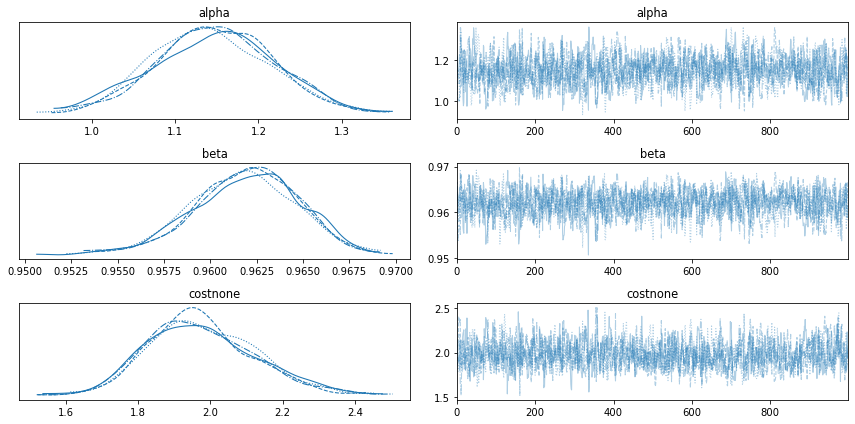

In [127]:
az.plot_trace(trace_prag_argstrength)
plt.tight_layout()

In [128]:
save_trace(
    'prag_argstrength', 
    trace_prag_argstrength,
    path_to_folder=folder_exp1_traces
)

By-participant $\alpha$ and $\beta$

In [129]:
model_prag_argstrength_hierarchical = factory_model_prag_argstrength_hierarchical(
    data, 
    possible_observations, 
    possible_utterances
)

Defining hierarchical model
Defining hierarchical model
Defining hierarchical model
Defining hierarchical model


In [130]:
with model_prag_argstrength_hierarchical:
    trace_prag_argstrength_hierarchical = pm.sample(
        draws=1000,
        tune=1000,
        target_accept=0.95,
        return_inferencedata=True
    )

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [costnone, beta_offset, beta_sigma, beta_mu, alpha_zs, alpha_sigma, alpha_mu]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 621 seconds.
The number of effective samples is smaller than 25% for some parameters.


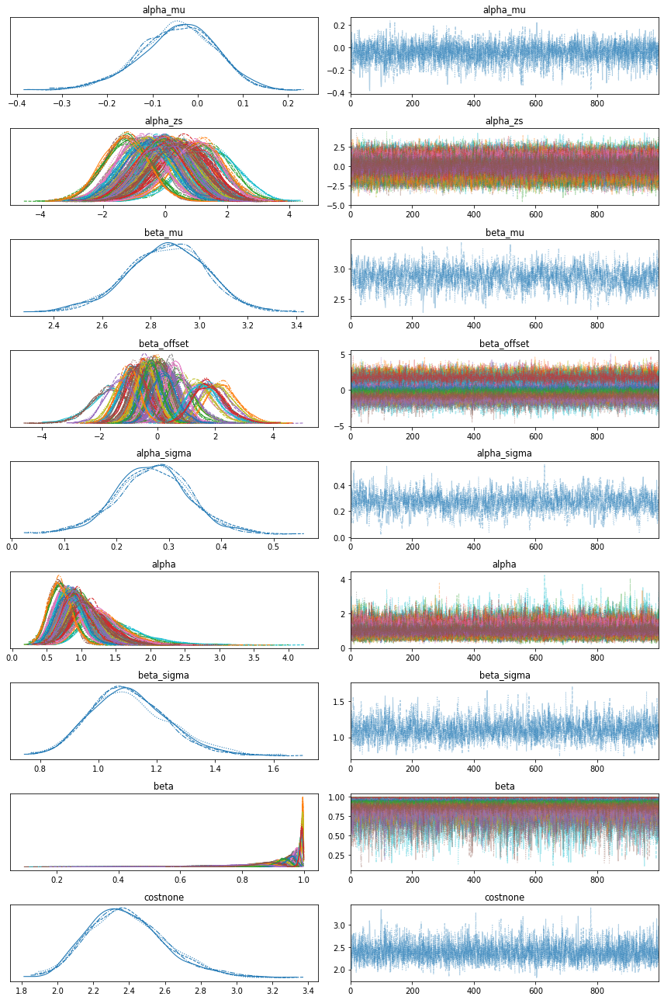

In [131]:
az.plot_trace(trace_prag_argstrength_hierarchical)
plt.tight_layout()

In [133]:
save_trace(
    'prag_argstrength_hierarchical', 
    trace_prag_argstrength_hierarchical,
    path_to_folder=folder_exp1_traces
)

### Nonparametric (exploratory)

**Completely pooled**

In [152]:
model_nonparametric_argstrength = factory_model_nonparametric_argstrength(
    data, 
    possible_observations, 
    possible_utterances
)

Defining non-hierarchical model
Defining non-hierarchical model


In [153]:
with model_nonparametric_argstrength:
    trace_nonparametric_argstrength = pm.sample(
        draws=1000,
        tune=1000,
        target_accept=0.95,
        return_inferencedata=True,
    )

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [costnone, beta, alpha]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 83 seconds.
The number of effective samples is smaller than 25% for some parameters.


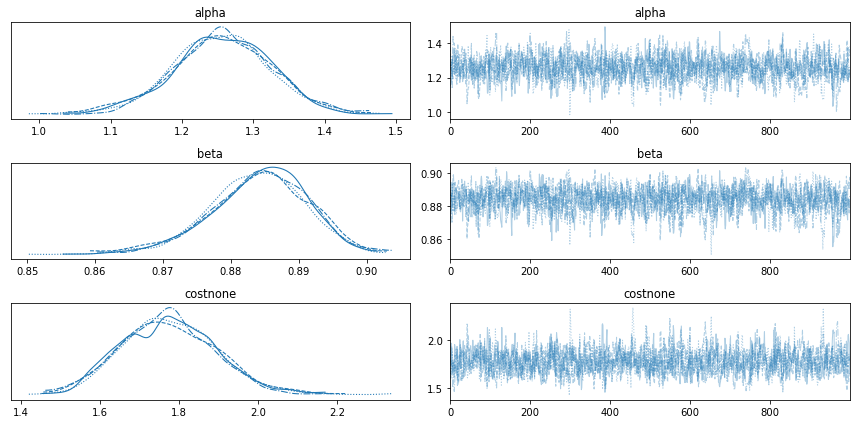

In [154]:
# run with argument strength calculated just using
# the possible observations in the experiment
az.plot_trace(trace_nonparametric_argstrength)
plt.tight_layout()
plt.show()

In [155]:
save_trace(
    'nonparametric_argstrength', 
    trace_nonparametric_argstrength,
    path_to_folder=folder_exp1_traces
)

**By-participant $\alpha$ and $\beta$**

In [156]:
model_nonparametric_argstrength_hierarchical = factory_model_nonparametric_argstrength_hierarchical(
    data, 
    possible_observations, 
    possible_utterances
)

Defining hierarchical model
Defining hierarchical model


In [157]:
with model_nonparametric_argstrength_hierarchical:
    trace_nonparametric_argstrength_hierarchical = pm.sample(
        draws=1000,
        tune=1000,
        target_accept=0.95,
        return_inferencedata=True,
    )

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [costnone, beta_offset, beta_sigma, beta_mu, alpha_zs, alpha_sigma, alpha_mu]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 433 seconds.
The number of effective samples is smaller than 25% for some parameters.


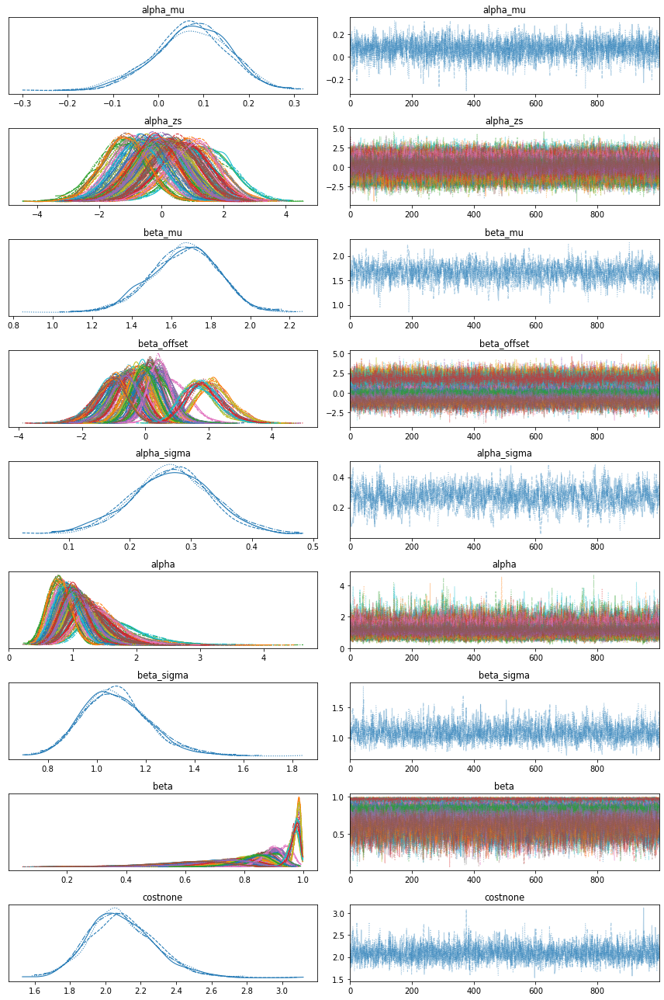

In [158]:
# run with argument strength calculated just using
# the possible observations in the experiment
az.plot_trace(trace_nonparametric_argstrength_hierarchical)
plt.tight_layout()
plt.show()

In [159]:
save_trace(
    'nonparametric_argstrength_hierarchical', 
    trace_nonparametric_argstrength_hierarchical,
    path_to_folder=folder_exp1_traces
)

## Get stored traces (after fitting)

In [110]:
exp1_traces = get_traces(folder_exp1_traces)

Getting  base
Objects for base not yet defined, attempting from file
Objects for base loaded from file

Getting  base_hierarchical
Objects for base_hierarchical not yet defined, attempting from file
Objects for base_hierarchical loaded from file

Getting  lr_argstrength
Objects for lr_argstrength not yet defined, attempting from file
Objects for lr_argstrength loaded from file

Getting  lr_argstrength_hierarchical
Objects for lr_argstrength_hierarchical not yet defined, attempting from file
Objects for lr_argstrength_hierarchical loaded from file

Getting  maximin_argstrength
Objects for maximin_argstrength not yet defined, attempting from file
Objects for maximin_argstrength loaded from file

Getting  maximin_argstrength_hierarchical
Objects for maximin_argstrength_hierarchical not yet defined, attempting from file
Objects for maximin_argstrength_hierarchical loaded from file

Getting  nonparametric_argstrength
Objects for nonparametric_argstrength not yet defined, attempting from fil

In [107]:
{k:v.observed_data.utterances_dim_0.values.shape for k,v in exp1_traces.items()}

{'base': (1472,),
 'base_hierarchical': (1472,),
 'lr_argstrength': (1472,),
 'lr_argstrength_hierarchical': (1472,),
 'maximin_argstrength': (1472,),
 'maximin_argstrength_hierarchical': (1472,),
 'nonparametric_argstrength': (1472,),
 'nonparametric_argstrength_hierarchical': (1472,),
 'prag_argstrength': (1472,),
 'prag_argstrength_hierarchical': (1472,)}

In [111]:
trace_base = exp1_traces['base']
trace_base_hierarchical = exp1_traces['base_hierarchical']
trace_lr_argstrength = exp1_traces['lr_argstrength']
trace_lr_argstrength_hierarchical = exp1_traces['lr_argstrength_hierarchical']
trace_maximin_argstrength = exp1_traces['maximin_argstrength']
trace_maximin_argstrength_hierarchical = exp1_traces['maximin_argstrength_hierarchical']
trace_nonparametric_argstrength = exp1_traces['nonparametric_argstrength']
trace_nonparametric_argstrength_hierarchical = exp1_traces['nonparametric_argstrength_hierarchical']
trace_prag_argstrength = exp1_traces['prag_argstrength']
trace_prag_argstrength_hierarchical = exp1_traces['prag_argstrength_hierarchical']

## Model comparison

**Pooled models**

In [112]:
loo_comparison_pooled = az.compare(
    {
        'base': trace_base,
        'lr argstrength': trace_lr_argstrength,
        'maximin argstrength': trace_maximin_argstrength,
        'prag argstrength': trace_prag_argstrength,
        'nonparametric argstrength': trace_nonparametric_argstrength
    }
)

<Axes: title={'center': 'Model comparison\nhigher is better'}, xlabel='elpd_loo (log)', ylabel='ranked models'>

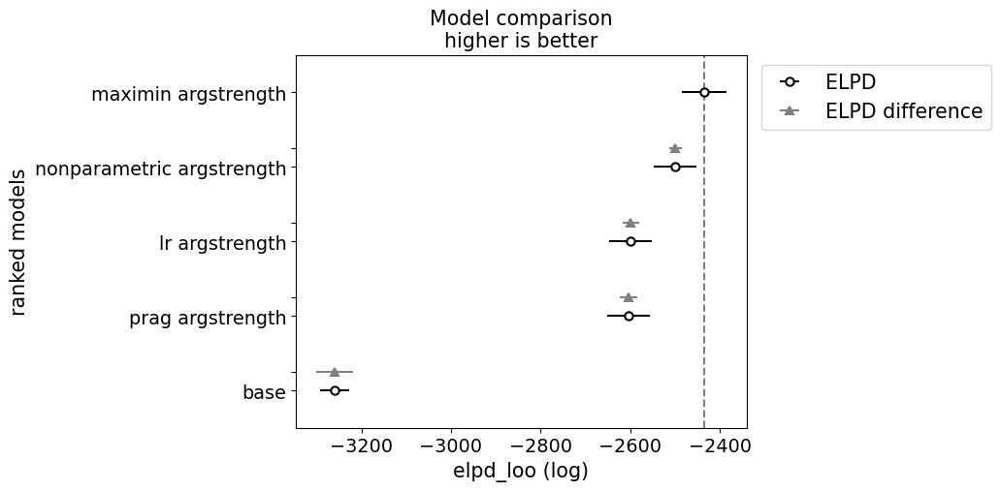

In [113]:
az.plot_compare(loo_comparison_pooled)

In [114]:
loo_comparison_pooled

,rank,elpd_loo,p_loo,elpd_diff,weight,se,dse,warning,scale
maximin argstrength,0,-2434.869123,2.854599,0.000000,0.832067,49.331900,0.000000,False,log
nonparametric argstrength,1,-2499.507086,4.232338,64.637964,0.104343,47.664268,14.235776,False,log
lr argstrength,2,-2598.655848,4.268085,163.786725,0.000000,47.759091,18.578548,False,log
prag argstrength,3,-2604.302995,4.525907,169.433872,0.000000,47.592729,18.873370,False,log
base,4,-3259.601877,2.256816,824.732754,0.063589,32.659822,40.852870,False,log


**Hierarchical models**

In [115]:
loo_comparison_hierarchical = az.compare(
    {
        'base': trace_base_hierarchical,
        'lr argstrength': trace_lr_argstrength_hierarchical,
        'maximin argstrength': trace_maximin_argstrength_hierarchical,
        'prag argstrength': trace_prag_argstrength_hierarchical,
        'nonparametric argstrength': trace_nonparametric_argstrength_hierarchical
    }
)

/home/fausto/anaconda3/envs/argumentative_language/lib/python3.8/site-packages/arviz/stats/stats.py:803: UserWarning: Estimated shape parameter of Pareto distribution is greater than 0.7 for one or more samples. You should consider using a more robust model, this is because importance sampling is less likely to work well if the marginal posterior and LOO posterior are very different. This is more likely to happen with a non-robust model and highly influential observations.
  warnings.warn(
/home/fausto/anaconda3/envs/argumentative_language/lib/python3.8/site-packages/arviz/stats/stats.py:803: UserWarning: Estimated shape parameter of Pareto distribution is greater than 0.7 for one or more samples. You should consider using a more robust model, this is because importance sampling is less likely to work well if the marginal posterior and LOO posterior are very different. This is more likely to happen with a non-robust model and highly influential observations.
  warnings.warn(
/home/faus

<Axes: title={'center': 'Model comparison\nhigher is better'}, xlabel='elpd_loo (log)', ylabel='ranked models'>

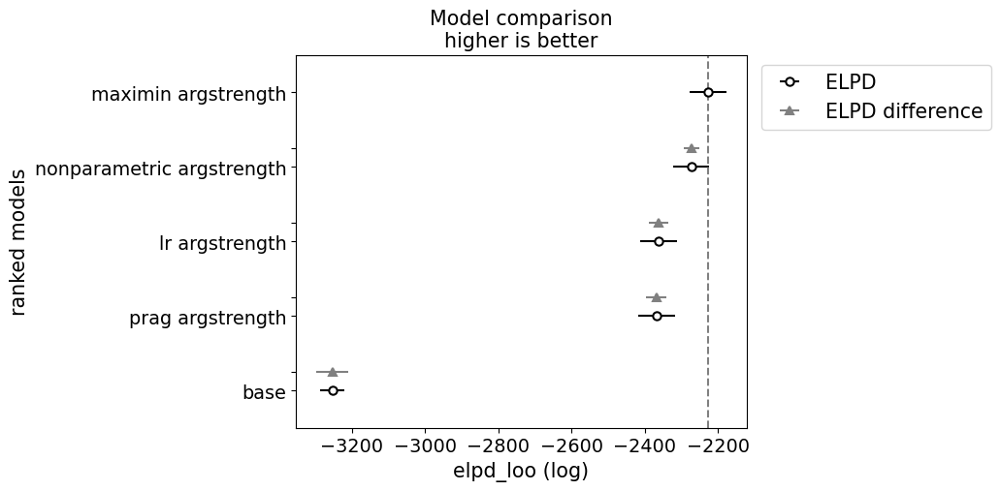

In [117]:
az.plot_compare(loo_comparison_hierarchical)

In [118]:
loo_comparison_hierarchical

,rank,elpd_loo,p_loo,elpd_diff,weight,se,dse,warning,scale
maximin argstrength,0,-2226.530546,101.675532,0.000000,0.519433,49.870750,0.000000,True,log
nonparametric argstrength,1,-2272.267663,109.970450,45.737117,0.288713,48.739096,21.514529,True,log
lr argstrength,2,-2361.676330,115.732502,135.145784,0.182617,50.280443,27.012967,True,log
prag argstrength,3,-2368.262427,115.477006,141.731881,0.000000,50.188359,27.173928,True,log
base,4,-3253.543495,40.554684,1027.012949,0.009237,32.482818,43.451770,False,log
